# Explore data augmentations

This notebook will be used to test different data augmentation strategies. In your config file, you can modify the augmentations by adding `data_augmentation_options`. For example, I would like to add a random RGB to gray transform with a probability of 0.2:
```
data_augmentation_options {
    random_rgb_to_gray {
    probability: 0.2
    }
```

A complete list of augmentation is provided the [`preprocessor.proto` file of the Tf Object Detection API](https://github.com/tensorflow/models/blob/master/research/object_detection/protos/preprocessor.proto).

### Helper functions

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Rectangle
import tensorflow as tf
from object_detection.core import preprocessor

In [2]:
def recenter_image(image):
    # ssd preprocessing
    image += [123.68, 116.779, 103.939]
    return image

def display_instances(image, bboxes, classes):
    image = recenter_image(image)
    w, h, _ = image.shape
    # resize the bboxes
    bboxes[:, [0, 2]] *= w
    bboxes[:, [1, 3]] *= h
    
    f, ax = plt.subplots(1, figsize=(10, 10))
    ax.imshow(image.astype(np.uint8))
    for bb, cl in zip(bboxes, classes):
        y1, x1, y2, x2 = bb
        rec = Rectangle((x1, y1), x2-x1, y2-y1, facecolor='none', edgecolor='r', linewidth=2)
        ax.add_patch(rec)
    plt.show()

def display_batch(batch):
    # get images, bboxes and classes
    batched_images = batch[0]['image'].numpy()
    batched_bboxes = batch[1]['groundtruth_boxes'].numpy()
    batched_classes = batch[1]['groundtruth_classes'].numpy()
    num_bboxes = batch[1]['num_groundtruth_boxes'].numpy()
    batch_size = batched_images.shape[0]
    for idx in range(batch_size):
        display_instances(batched_images[idx, ...], 
                          batched_bboxes[idx, :num_bboxes[idx], :],
                          batched_classes[idx, ...])

### Display augmentations

In [3]:
from utils import get_train_input

In [ ]:
train_dataset = get_train_input("/app/project/experiments/reference/pipeline_new.config");

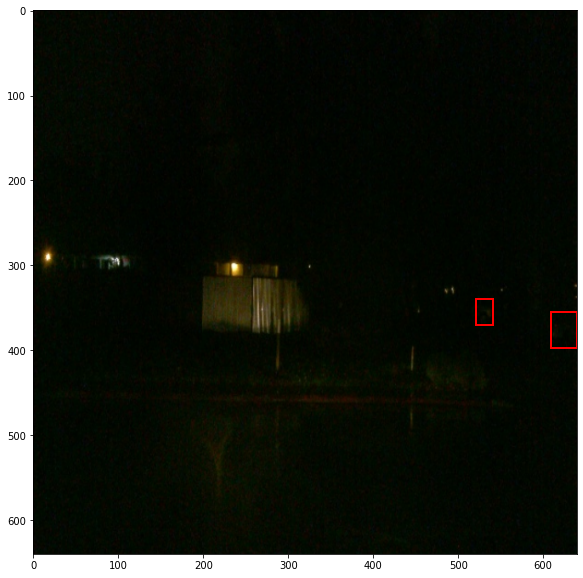

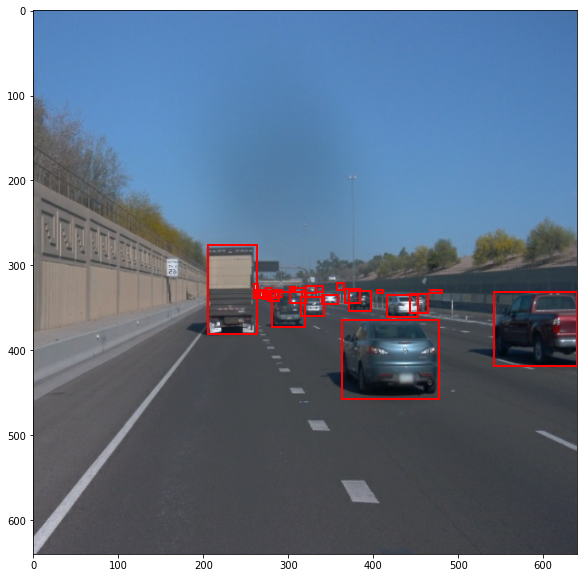

In [5]:
%matplotlib inline

for batch in train_dataset.take(1):
    display_batch(batch)

In EDA we saw that there are much fewer images taken in dark time of a day. So an idea worth trying is to increase image brightness and enhance contrast. Let us evaluate four possible augmentations:
- Random Adjust Brightness
- Adjust Gamma
- Random Adjust Contrast

We will plot images in four columns. First column will be original image and next three - augmentations.

(Scroll to the end of the page to see the argument for chosen augmentations.)

INFO:tensorflow:Reading unweighted datasets: ['/app/project/split/train/*.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['/app/project/split/train/*.tfrecord']
INFO:tensorflow:Number of filenames to read: 637


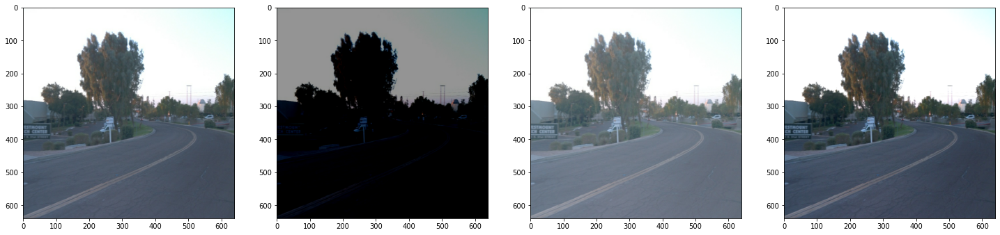

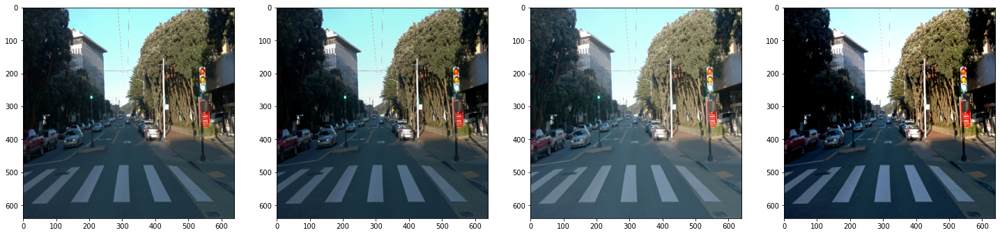

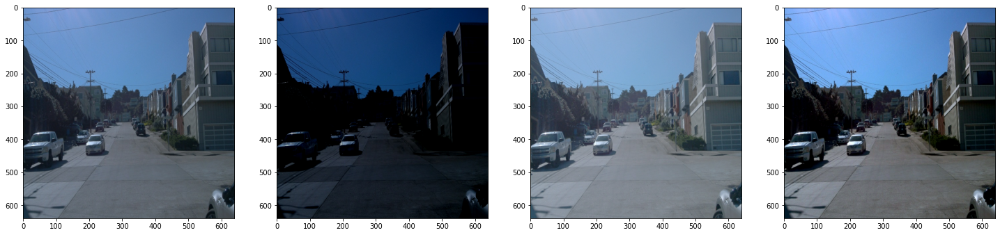

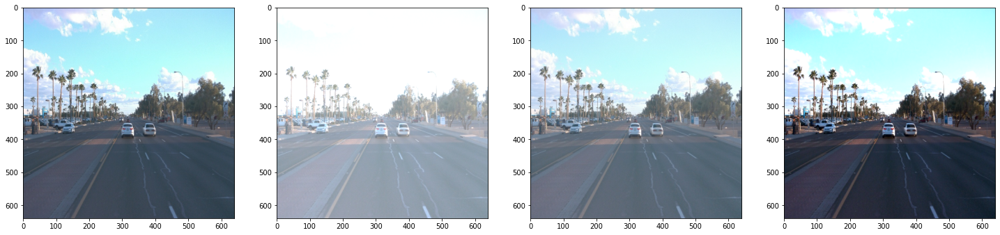

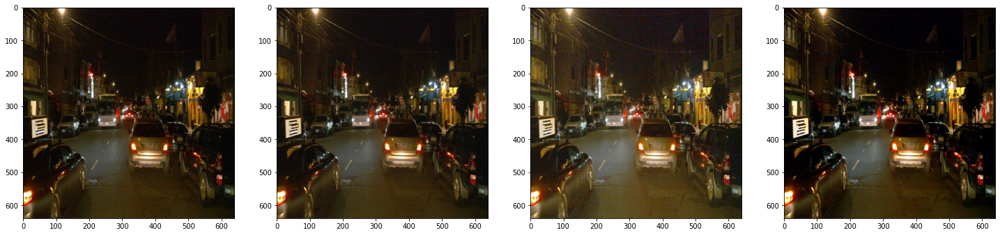

...

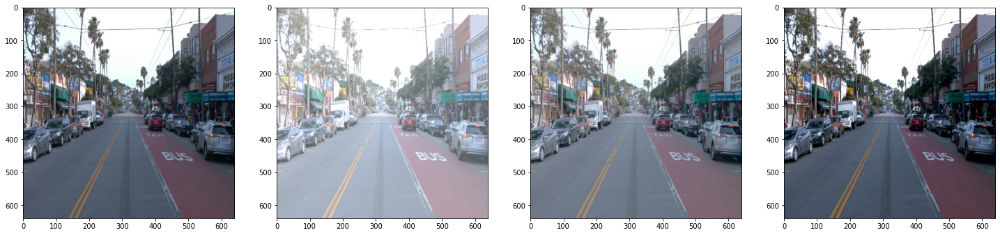

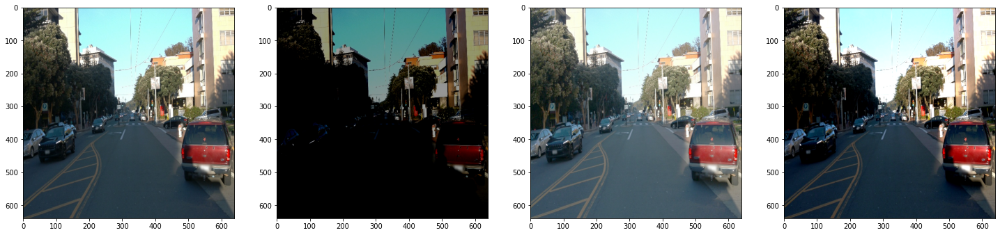

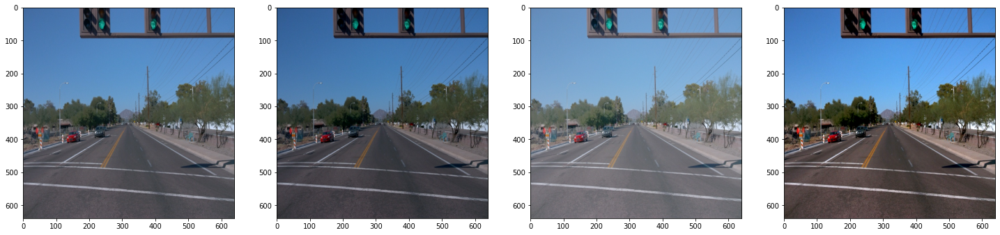

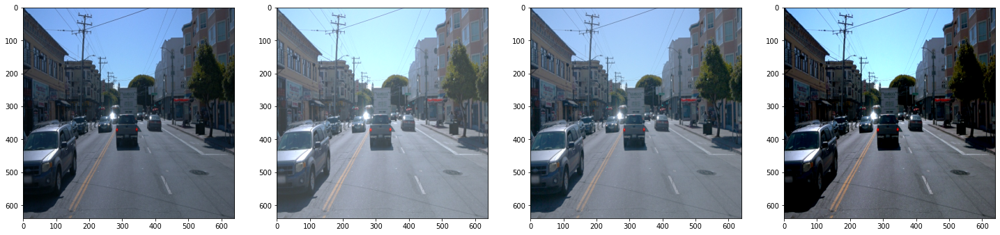

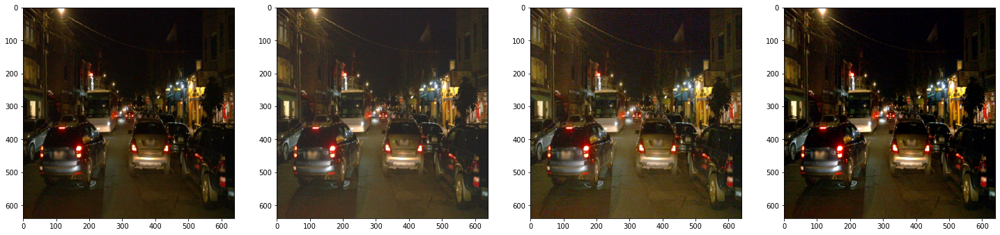

In [6]:
from utils import get_dataset

tfrecord_path = "/app/project/split/train/*.tfrecord"
dataset = get_dataset(tfrecord_path)

dataset = dataset.shuffle(500)

for index in range(20):
    image = next(iter(dataset))["image"]

    new_image1 = preprocessor.random_adjust_brightness(tf.cast(image, dtype=tf.float32), max_delta=0.5)
    new_image2 = preprocessor.adjust_gamma(tf.cast(image, dtype=tf.float32), gamma=0.7, gain=1)
    new_image3 = preprocessor.random_adjust_contrast(tf.cast(image, dtype=tf.float32), min_delta=1.2, max_delta=1.5)

    fig, axs = plt.subplots(1, 4, figsize=(25, 25))

    axs[0].imshow(image.numpy().astype(np.uint8))
    axs[1].imshow(new_image1.numpy().astype(np.uint8))
    axs[2].imshow(new_image2.numpy().astype(np.uint8))
    axs[3].imshow(new_image3.numpy().astype(np.uint8))

    plt.show()

We can clearly see that random nature of adjusting brightness (second column) is not optimal. Some images are made darker. Gamma adjustment makes images always brighter. Contrast adjustment does not necessarily makes images brighter but it does make them clearer. That is why for augmentation we pick: Gamma Adjustment and Random Contrast Adjustment.